<a href="https://colab.research.google.com/github/vmadalasa/EVAConsolidated/blob/master/EVAS10/S10_Assignment_with_ReduceLR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Memory Information

In [0]:
import psutil
def get_size(bytes, suffix="B"):
    factor = 1024
    for unit in ["", "K", "M", "G", "T", "P"]:
        if bytes < factor:
            return f"{bytes:.2f}{unit}{suffix}"
        bytes /= factor
print("="*40, "Memory Information", "="*40)
svmem = psutil.virtual_memory()
print(f"Total: {get_size(svmem.total)}") ; print(f"Available: {get_size(svmem.available)}")
print(f"Used: {get_size(svmem.used)}") ; print(f"Percentage: {svmem.percent}%")

======================================== Memory Information ========================================
Total: 25.51GB
Available: 24.50GB
Used: 938.68MB
Percentage: 4.0%


# GPU Information

In [0]:
!pip install albumentations==0.4.5 --quiet

In [0]:
!nvidia-smi

Thu Jun  4 08:07:16 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
device = 'cuda'
from CusResNet import CusResNet18

In [0]:
model = CusResNet18().to(device)

In [0]:
from augmentation import CIFAR10_AlbumTrans
from data import CIFAR10DataLoader
from data_summary import model_summary, display

Files already downloaded and verified
Files already downloaded and verified


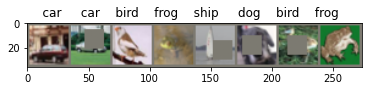

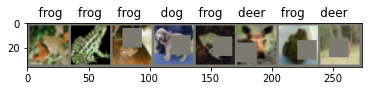

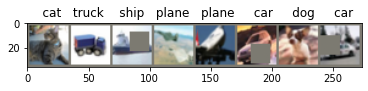

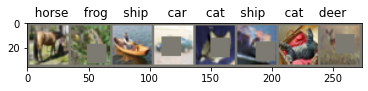

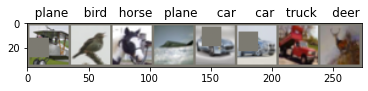

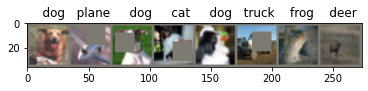

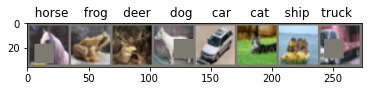

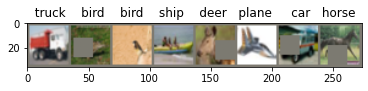

In [0]:
trans = CIFAR10_AlbumTrans()
data = CIFAR10DataLoader(trans, batch_size=128)
train_loader, test_loader = data.get_loaders()
display(train_loader, 64)

In [0]:
model_summary(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
      BatchNorm2d-14          [-1, 128,

In [0]:
import torch
import torch.nn as nn
import torch.optim as optim
from find_lr import LRFinder

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=1e-7, momentum= 0.9)
lr_finder = LRFinder(model, optimizer, criterion, device= 'cuda')

  pip install torch-lr-finder -v --global-option="amp"


In [0]:
lr_finder.range_test(train_loader, end_lr=100, num_iter=100, step_mode="exp") #Fast AI Approach

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()


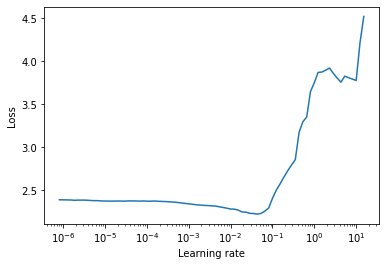

In [0]:
lr_finder.plot()

In [0]:
print('Least Lost as per Fast AI: ', min(lr_finder.history['loss']))
best_lr = lr_finder.history['lr'][lr_finder.history['loss'].index(min(lr_finder.history['loss']))]
print('Best lr as per Fast AI: ', best_lr)

Least Lost as per Fast AI:  2.2225147841170574
Best lr as per Fast AI:  0.043287612810830614


In [0]:
lr_finder.reset()

In [0]:
from test import Test
from train import Train
from torch.optim.lr_scheduler import ReduceLROnPlateau

optimizer = optim.SGD(model.parameters(), lr=best_lr, momentum= 0.9)
test = Test(model, device, test_loader)
train = Train(model, device, train_loader, optimizer)
scheduler = ReduceLROnPlateau(optimizer, mode= 'max', patience= 2)

In [0]:
lr_list = []
epochs = 50
print('='*20 + 'START' + '='*20)
for epoch in range(epochs):
  print('='*20 + f' EPOCH: {epoch+1} ' + '='*20)
  train.train(epoch)
  lr_list.append(optimizer.param_groups[0]['lr'])
  test.test()
  scheduler.step(test.test_acc[-1]) #Have to give the val_loss or val_accuracy here. The metric on which we can to check and 

  0%|          | 0/391 [00:00<?, ?it/s]

====================START====================
==================== EPOCH: 1 ====================


Loss=1.1753000020980835 Batch_id=390 Accuracy=41.39: 100%|██████████| 391/391 [00:32<00:00, 12.21it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0098, Accuracy: 5580/10000 (55.80%)

==================== EPOCH: 2 ====================


Loss=1.2247233390808105 Batch_id=390 Accuracy=59.64: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0104, Accuracy: 5852/10000 (58.52%)

==================== EPOCH: 3 ====================


Loss=0.7524940371513367 Batch_id=390 Accuracy=68.21: 100%|██████████| 391/391 [00:32<00:00, 12.22it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0059, Accuracy: 7385/10000 (73.85%)

==================== EPOCH: 4 ====================


Loss=0.912579357624054 Batch_id=390 Accuracy=73.18: 100%|██████████| 391/391 [00:32<00:00, 12.20it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0064, Accuracy: 7348/10000 (73.48%)

==================== EPOCH: 5 ====================


Loss=0.780315101146698 Batch_id=390 Accuracy=76.27: 100%|██████████| 391/391 [00:32<00:00, 12.19it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0060, Accuracy: 7505/10000 (75.05%)

==================== EPOCH: 6 ====================


Loss=0.5425089597702026 Batch_id=390 Accuracy=78.54: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0049, Accuracy: 7994/10000 (79.94%)

==================== EPOCH: 7 ====================


Loss=0.4436628818511963 Batch_id=390 Accuracy=80.22: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0044, Accuracy: 8112/10000 (81.12%)

==================== EPOCH: 8 ====================


Loss=0.541318416595459 Batch_id=390 Accuracy=81.84: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0042, Accuracy: 8178/10000 (81.78%)

==================== EPOCH: 9 ====================


Loss=0.39086538553237915 Batch_id=390 Accuracy=83.13: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0037, Accuracy: 8437/10000 (84.37%)

==================== EPOCH: 10 ====================


Loss=0.3062868118286133 Batch_id=390 Accuracy=84.04: 100%|██████████| 391/391 [00:32<00:00, 12.19it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 8456/10000 (84.56%)

==================== EPOCH: 11 ====================


Loss=0.2926444113254547 Batch_id=390 Accuracy=85.07: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8656/10000 (86.56%)

==================== EPOCH: 12 ====================


Loss=0.3130093216896057 Batch_id=390 Accuracy=85.94: 100%|██████████| 391/391 [00:32<00:00, 12.19it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8661/10000 (86.61%)

==================== EPOCH: 13 ====================


Loss=0.3296017646789551 Batch_id=390 Accuracy=86.53: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8665/10000 (86.65%)

==================== EPOCH: 14 ====================


Loss=0.4725351929664612 Batch_id=390 Accuracy=87.31: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 8674/10000 (86.74%)

==================== EPOCH: 15 ====================


Loss=0.346708208322525 Batch_id=390 Accuracy=88.01: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 8658/10000 (86.58%)

==================== EPOCH: 16 ====================


Loss=0.5870903134346008 Batch_id=390 Accuracy=88.59: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8815/10000 (88.15%)

==================== EPOCH: 17 ====================


Loss=0.572111964225769 Batch_id=390 Accuracy=89.10: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8798/10000 (87.98%)

==================== EPOCH: 18 ====================


Loss=0.37536707520484924 Batch_id=390 Accuracy=89.62: 100%|██████████| 391/391 [00:32<00:00, 12.19it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8803/10000 (88.03%)

==================== EPOCH: 19 ====================


Loss=0.30048173666000366 Batch_id=390 Accuracy=90.09: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 8872/10000 (88.72%)

==================== EPOCH: 20 ====================


Loss=0.2729252874851227 Batch_id=390 Accuracy=90.43: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8887/10000 (88.87%)

==================== EPOCH: 21 ====================


Loss=0.12168323993682861 Batch_id=390 Accuracy=90.89: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8864/10000 (88.64%)

==================== EPOCH: 22 ====================


Loss=0.26445698738098145 Batch_id=390 Accuracy=91.47: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8941/10000 (89.41%)

==================== EPOCH: 23 ====================


Loss=0.27201247215270996 Batch_id=390 Accuracy=91.65: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 8988/10000 (89.88%)

==================== EPOCH: 24 ====================


Loss=0.23224620521068573 Batch_id=390 Accuracy=91.72: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 8971/10000 (89.71%)

==================== EPOCH: 25 ====================


Loss=0.2198442965745926 Batch_id=390 Accuracy=92.05: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 8953/10000 (89.53%)

==================== EPOCH: 26 ====================


Loss=0.22896771132946014 Batch_id=390 Accuracy=92.52: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 8967/10000 (89.67%)

==================== EPOCH: 27 ====================


Loss=0.1550966203212738 Batch_id=390 Accuracy=94.49: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9161/10000 (91.61%)

==================== EPOCH: 28 ====================


Loss=0.1532580405473709 Batch_id=390 Accuracy=95.39: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9184/10000 (91.84%)

==================== EPOCH: 29 ====================


Loss=0.14800947904586792 Batch_id=390 Accuracy=95.56: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9197/10000 (91.97%)

==================== EPOCH: 30 ====================


Loss=0.07236523926258087 Batch_id=390 Accuracy=95.94: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9223/10000 (92.23%)

==================== EPOCH: 31 ====================


Loss=0.29823070764541626 Batch_id=390 Accuracy=96.03: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9201/10000 (92.01%)

==================== EPOCH: 32 ====================


Loss=0.13764484226703644 Batch_id=390 Accuracy=96.10: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9226/10000 (92.26%)

==================== EPOCH: 33 ====================


Loss=0.1508096307516098 Batch_id=390 Accuracy=96.16: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9228/10000 (92.28%)

==================== EPOCH: 34 ====================


Loss=0.08074025809764862 Batch_id=390 Accuracy=96.25: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9222/10000 (92.22%)

==================== EPOCH: 35 ====================


Loss=0.197378009557724 Batch_id=390 Accuracy=96.35: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9208/10000 (92.08%)

==================== EPOCH: 36 ====================


Loss=0.241120383143425 Batch_id=390 Accuracy=96.28: 100%|██████████| 391/391 [00:32<00:00, 12.11it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9230/10000 (92.30%)

==================== EPOCH: 37 ====================


Loss=0.07571039348840714 Batch_id=390 Accuracy=96.51: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9244/10000 (92.44%)

==================== EPOCH: 38 ====================


Loss=0.060840655118227005 Batch_id=390 Accuracy=96.50: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9228/10000 (92.28%)

==================== EPOCH: 39 ====================


Loss=0.14467719197273254 Batch_id=390 Accuracy=96.55: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9231/10000 (92.31%)

==================== EPOCH: 40 ====================


Loss=0.19714294373989105 Batch_id=390 Accuracy=96.72: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9241/10000 (92.41%)

==================== EPOCH: 41 ====================


Loss=0.053303658962249756 Batch_id=390 Accuracy=96.79: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9242/10000 (92.42%)

==================== EPOCH: 42 ====================


Loss=0.04270099848508835 Batch_id=390 Accuracy=96.82: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9232/10000 (92.32%)

==================== EPOCH: 43 ====================


Loss=0.12008734047412872 Batch_id=390 Accuracy=96.95: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9234/10000 (92.34%)

==================== EPOCH: 44 ====================


Loss=0.1260290890932083 Batch_id=390 Accuracy=96.94: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9233/10000 (92.33%)

==================== EPOCH: 45 ====================


Loss=0.0696895569562912 Batch_id=390 Accuracy=96.90: 100%|██████████| 391/391 [00:32<00:00, 12.17it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 9229/10000 (92.29%)

==================== EPOCH: 46 ====================


Loss=0.04103852063417435 Batch_id=390 Accuracy=96.95: 100%|██████████| 391/391 [00:32<00:00, 12.18it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9232/10000 (92.32%)

==================== EPOCH: 47 ====================


Loss=0.12640754878520966 Batch_id=390 Accuracy=96.89: 100%|██████████| 391/391 [00:32<00:00, 12.15it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9238/10000 (92.38%)

==================== EPOCH: 48 ====================


Loss=0.03156570717692375 Batch_id=390 Accuracy=97.02: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9242/10000 (92.42%)

==================== EPOCH: 49 ====================


Loss=0.11202764511108398 Batch_id=390 Accuracy=97.07: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 9238/10000 (92.38%)

==================== EPOCH: 50 ====================


Loss=0.06739276647567749 Batch_id=390 Accuracy=96.88: 100%|██████████| 391/391 [00:32<00:00, 12.16it/s]



Test set: Average loss: 0.0022, Accuracy: 9237/10000 (92.37%)



In [0]:
import plot
from plot import mis, gen_cam, plot_pred_cam, plot_act_cam

In [0]:
best_model = CusResNet18().to(device)
best_model.load_state_dict(torch.load('/content/classifier.pt'))
best_model.eval()
print('Best Model Loaded!')

Best Model Loaded!


Directory  /content/mis_class/ and /content/mis_class/images  already exists

Test set: Average loss: -18.2345, Accuracy: 9244/10000 (92.44%)

torch.Size([756, 3, 32, 32])


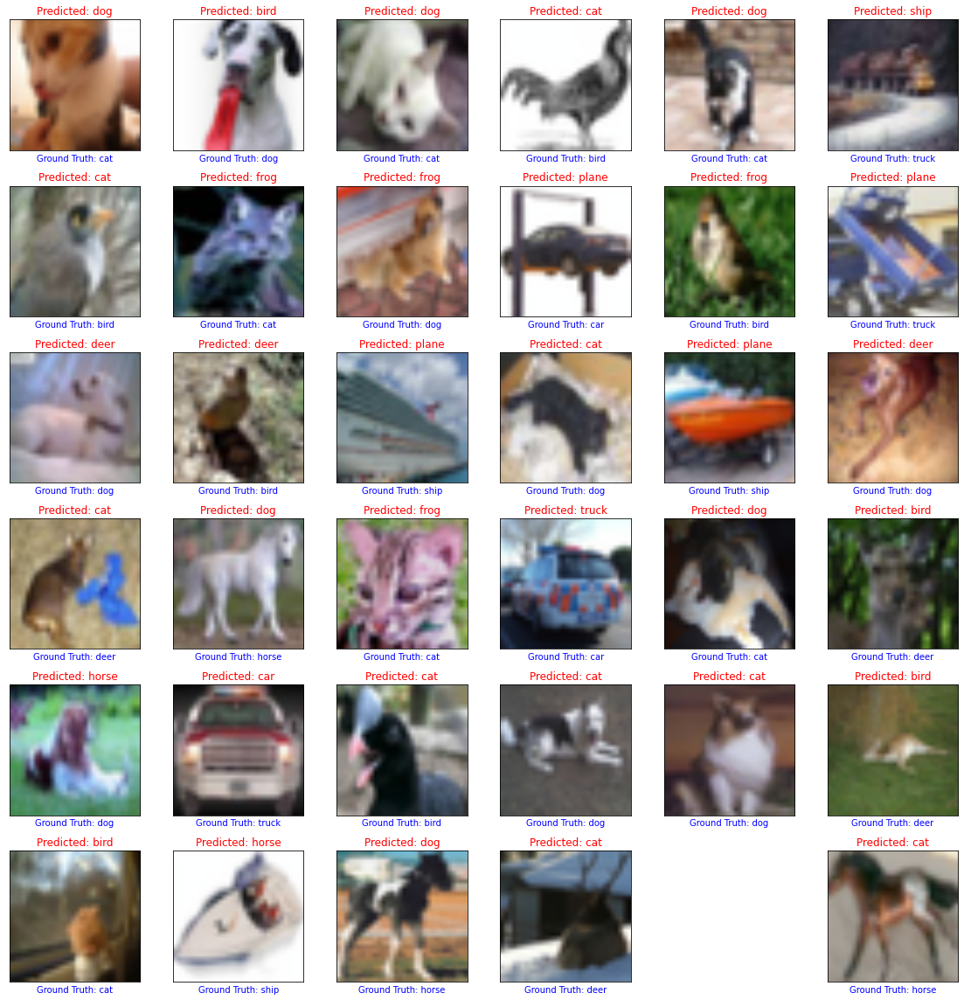

In [0]:
mis(best_model, device, test_loader, 36)

In [0]:
layers = ['layer1', 'layer2', 'layer3', 'layer4',]
for layer in layers:
  gen_cam(best_model, layer) #GradCAM for Misclassified w.r.t Predicted Class
  gen_cam(best_model, layer, class_idx= plot.true_list) #GradCAM for Misclassified w.r.t Actual Class

Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists
Directory  /content/result_pred/  already exists
Directory  /content/heatmap_pred/  already exists
Directory  /content/result_act/  already exists
Directory  /content/heatmap_act/  already exists


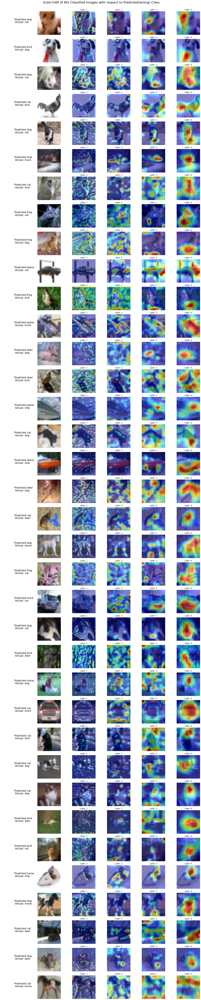

In [0]:
plot_pred_cam(36, 4)

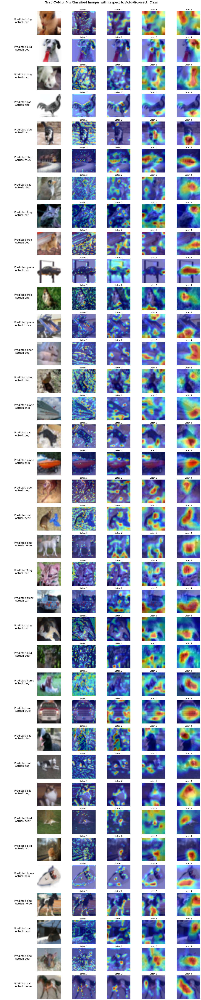

In [0]:
plot_act_cam(36,4)

In [0]:
from graphs import acc_loss, testvtrain, class_acc

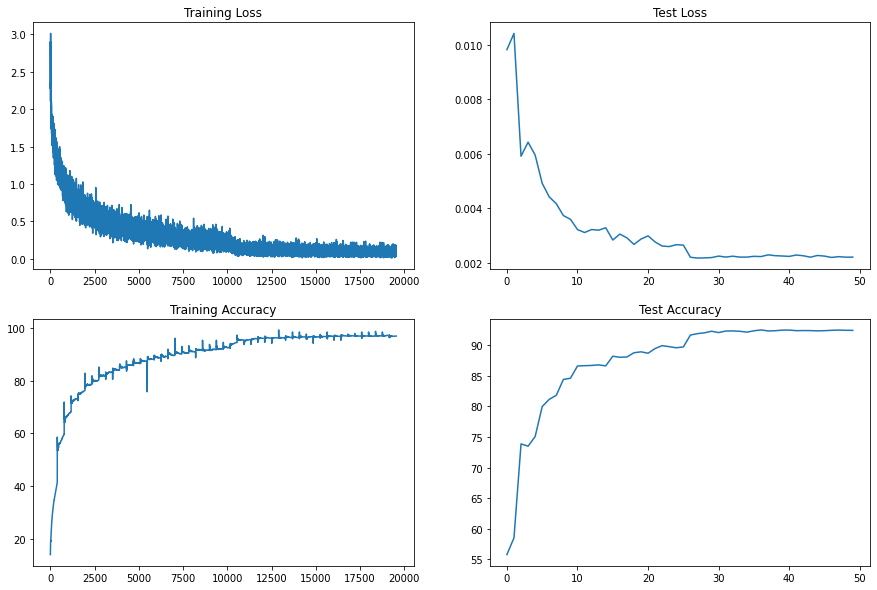

In [0]:
acc_loss(train, test)

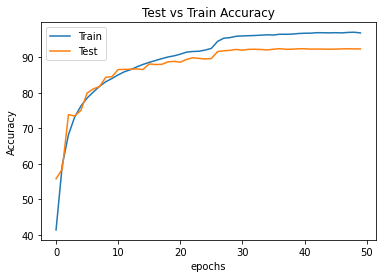

In [0]:
testvtrain(train, test)

In [0]:
class_acc(model, device, test_loader)

Accuracy of plane : 92 %
Accuracy of   car : 96 %
Accuracy of  bird : 88 %
Accuracy of   cat : 84 %
Accuracy of  deer : 93 %
Accuracy of   dog : 87 %
Accuracy of  frog : 95 %
Accuracy of horse : 95 %
Accuracy of  ship : 96 %
Accuracy of truck : 95 %


In [0]:
optimizer.param_groups[0]['lr']

4.328761281083063e-07

In [0]:
len(lr_list)

50

In [0]:
set_lr = set(lr_list)

In [0]:
len(set_lr)

6

In [0]:
set_lr

{4.328761281083063e-07,
 4.328761281083063e-06,
 4.3287612810830625e-05,
 0.0004328761281083062,
 0.004328761281083062,
 0.043287612810830614}

In [0]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Learning Rate')

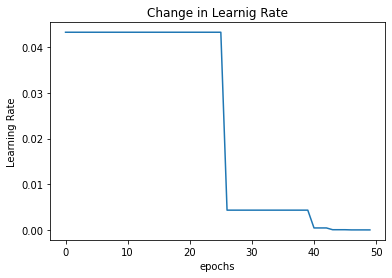

In [0]:
plt.plot(lr_list)
plt.title('Change in Learnig Rate')
plt.xlabel('epochs')
plt.ylabel('Learning Rate')